In [1]:
from os import path
import matplotlib.pylab as plt
import numpy as np
from segyio import TraceField
import segyio
import numpy as np

### Overview of data ###

The Poseidon data comes with 4 seismic volumes in segy format.

3-angle stacks:
sdn11_TbsdmF_Near_Nov_11_32bit.segy, sdn11_TbsdmF_Mid_Nov_11_32bit.segy, and sdn11_TbsdmF_Far_Nov_11_32bit.segy

*CGG's processing report contains the angles used:

Final Angle Stacks
a. Full Stack = 6 - 42 ̊

b. Near Stack = 6 - 18 ̊ 

c. Mid Stack = 18 - 30 ̊ 

d. Far Stack = 30 - 42 ̊

And a full stack with AGC applied:
psdn11_TbsdmF_full_w_AGC_Nov11.segy

The package includes VSP survey, a wavelet extraction and an associated time-depth mapping. 

The las file,

COP_Pharos-1_logs_time.las - Well log in TWT (Can directly compare to seismic)

has been exported with a "time index" so this can be compared directly with the seismic data.


### Print out the Ebcdic header to coordinate the seismic ###

Relating the seismic to the wells, we need to delve into the ebcdic header
which has been nicely populated for Poseidon. 

To overlay the well-logs with the seismic we need to know coordinate system used:

CRS: GDA94 / MGA Zone 51 ("")

And we want to make sure the inline/xline are coming from the correct byte locations:

Inline number               : bytes 5-8 
Xline number                : bytes 21-24

And where the traces are in Easting and Northing:
X coordinate                : bytes 73-76
Y coordinate                : bytes 77-80
Coordinate scale factor: 100.00000



In [184]:
#DATAPATH = path.expanduser("/Volumes/Backup/Poseidon/")
DATAPATH = path.expanduser("~/Downloads")

In [3]:
import codecs
 
# Open SEGY file and read the 3200 byte EBCDIC header
with open(path.join(DATAPATH,"psdn11_TbsdmF_Far_Nov_11_32bit.segy"), 'rb') as fp:
    buf = fp.read(3200)
    fp.close()
 
# Convert EBCDIC to ASCII using codec 'cp500'
ebcdic = codecs.decode(buf, 'cp500')
 
# Print the results to the command line
for i in range(0,3200,80):
    print (ebcdic[i:i+80])

C 1 SEGY OUTPUT FROM Petrel 2016.3 (64-bit) Friday, September 29 2017 13:20:07  
C 2 Name: psdn11_TbsdmF_Far_Nov_11 Type: 3D seismic                             
C 3                                                                             
C 4 First inline: 983    Last inline: 4419                                      
C 5 First xline:  504    Last xline:  5556                                      
C 6 CRS: GDA94 / MGA Zone 51 ("") Ýnull,null¨                                   
C 7 X min: 367746.08 max: 457555.01 delta: 89808.93                             
C 8 Y min: 8447583.82 max: 8537550.67 delta: 89966.84                           
C 9 Time min: -6002.00 max: 2.00 delta: 6004.00                                 
C10 Lat min: 14.02'31.5106"S max: 13.13'33.5530"S delta: 0.48'57.9576"          
C11 Long min: 121.46'30.7075"E max: 122.36'29.6334"E delta: 0.49'58.9260"       
C12 Trace min: -6000.00 max: -0.00 delta: 6000.00                               
C13 Seismic (template) min: 

### Acessing Seismic data ###

We're going to use the segyio module to access the data for us. These datasets are large 
and we can't expect to load them into memory all at once. 

Install the segyio program using this command in your Jupyter notebook.

!pip install segyio


In [4]:
#### This takes ages because the data is large

In [35]:

with segyio.open(path.join(DATAPATH,"psdn11_TbsdmF_Far_Nov_11_32bit.segy")) as fp:
    # these are unique
    ilines = fp.ilines
    xlines = fp.xlines
    
    # we will need all of them
    all_ilines = fp.attributes(TraceField.INLINE_3D)[:]
    all_xlines = fp.attributes(TraceField.CROSSLINE_3D)[:]    
    
    srcx = fp.attributes(TraceField.SourceX)[:]
    srcy = fp.attributes(TraceField.SourceY)[:]    


segyio "line" modes can grab entire inlines and xlines all at once. 
The Segy rev. 0 and 1 standards don't specify the standard byte locations, 

Our byte-locations are Inline number : bytes 5-8 Xline number : bytes 21-24.

C 4 First inline: 983    Last inline: 4419                                      
C 5 First xline:  504    Last xline:  5556                                      

QC segyio got it right.

In [228]:
print (ilines.min(), ilines.max())
print (xlines.min(), xlines.max())
    

983 4419
504 5556


In [229]:
with segyio.open(path.join(DATAPATH,"psdn11_TbsdmF_Mid_Nov_11_32bit.segy")) as fp:
    iline = fp.iline[1427]

In [230]:
#
prctl_rng = np.percentile(iline, 80) - np.percentile(iline, 20)
iline /= prctl_rng

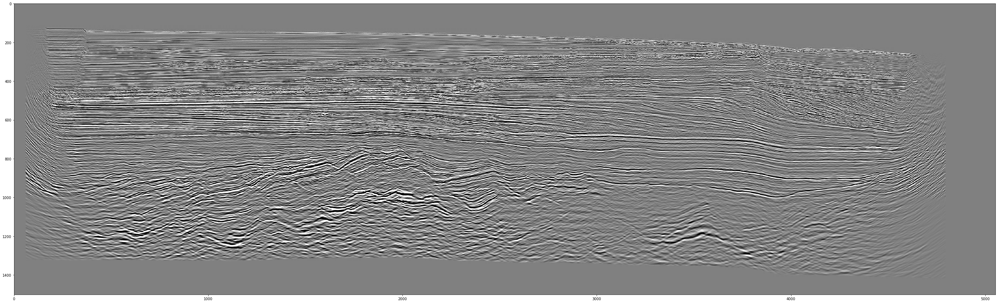

In [231]:
fig = plt.figure(figsize=(50,25))
plt.imshow(iline.T, cmap='gray', vmin=-2, vmax=2)
plt.show()

To co-render with a well we need to look up the coorindate. 

Sonic logs for  Pharos-1 contain the lat/long coordinates of the well head

In [232]:
import lasio

las = lasio.read(path.join(DATAPATH, "COP_Pharos-1_SonicScanner/COP_Pharos-1_SonicScanner_L0_PnS_SLB.las"))

In [233]:
print (las.header['Parameter']['LATI'])
print (las.header['Parameter']['LONG'])

HeaderItem(mnemonic=LATI, unit=DEG, value=-13.682004, descr=Well Surface Loc...)
HeaderItem(mnemonic=LONG, unit=DEG, value=122.399025, descr=Well Surface Loc...)


We use pyproj to convert the easting/northing coorindates to lat/long

GDA95 is a coordinate system for Australia, MGA Zone 51 is similar to a USA state plane id. 

The epsg codes for these things can be found here:
http://spatialreference.org/ref/epsg/gda94-mga-zone-51/

C 6 CRS: GDA94 / MGA Zone 51 ("") Ýnull,null¨                                   
C 7 X min: 367746.08 max: 457555.01 delta: 89808.93                             
C 8 Y min: 8447583.82 max: 8537550.67 delta: 89966.84                           

In [234]:
# figure out the northing and easting from the well
import pyproj

# these values from the ebcdic header
latitude, longitude = -13.682004, 122.399025

gda94 = pyproj.Proj(init='epsg:4283')
mgaz51 = pyproj.Proj(init='epsg:28351')

easting, northing = pyproj.transform(gda94, mgaz51, longitude, latitude)

print (easting, northing)

435010.9299936868 8487361.394442786


C16 Coordinate scale factor: 100.00000  

In [235]:
print (np.min(srcx/100.), np.max(srcx/100.))
print (np.min(srcy/100.), np.max(srcy/100.))

367756.9 457544.2
8447595.02 8537539.47


In [236]:
print(np.argmin(np.abs(srcx/100 - easting)))
print(np.argmin(np.abs(srcy/100 - northing)))

14175224
70615


In [237]:
print ("inline of well : ", all_ilines[14175224])
print ("xline of well : ", all_xlines[14175224])

inline of well :  3788
xline of well :  2063


In [238]:
# this guy has time as it's axis
_time_logs = lasio.read(path.join(DATAPATH, "Pharos-1_VSP/COP_Pharos-1_logs_time.las"))
time_logs = _time_logs.df()

In [239]:
# DTCO is in micro sec/ft
_time_logs.header['Curves']['DTCO']
time_logs['VP'] = 1.E+6 * .3048 / time_logs['DTCO']
# acoustic impedance is like seismic
time_logs['AI'] = time_logs['DTCO'] * time_logs['RHOB']

In [240]:
with segyio.open(path.join(DATAPATH,"psdn11_TbsdmF_Far_Nov_11_32bit.segy")) as fp:
    tiline = fp.iline[3788]

In [241]:
well_log = np.empty(tiline.shape) * np.nan


In [242]:
## from scipy.interpolate import interp1d 
f = interp1d(time_logs.index, time_logs['DTCO'])

well_log[2063-5:2063+6,:] = f(np.arange(0,1501)*0.002)

f(np.arange(0,1501)*0.002)

array([ 200.00003,  200.00005,  200.     , ...,   87.45232,   91.12157,
         94.39976])

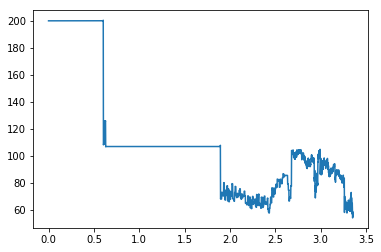

In [243]:
plt.plot(time_logs['DTCO'])
plt.show()

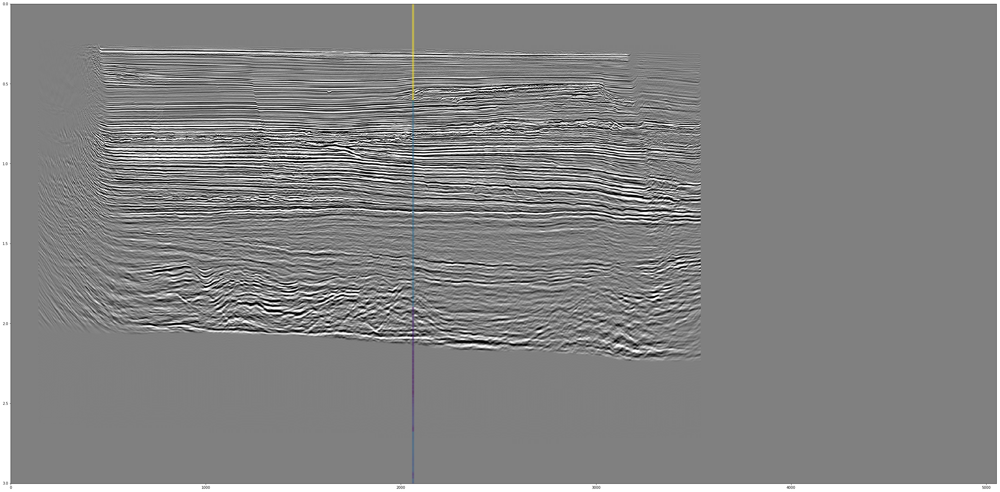

In [245]:
tiline /= np.std(tiline[tiline > 0])

fig = plt.figure(figsize=(50,25))
plt.imshow(tiline.T, cmap='gray', vmin=-2, vmax=2, extent=[0,iline.shape[0],1501*0.002,0], aspect='auto')
plt.imshow(well_log[:,:].T, extent=[0,iline.shape[0],1501*0.002,0], alpha=0.5, aspect='auto')
plt.show()

### AVO inversion(s)

First a sparse spike using the wavlet derived in VSP data.
Second an AVO inversion for AI/SI from the pre-stack data.


In [246]:
DATAPATH = path.expanduser("/Volumes/Backup/Poseidon/")

In [247]:
iline.shape

(5053, 1501)

In [248]:
small_iline = iline[:,400:800]

The VSP workflow includes a wavelet we couldn't find, use the statistical wavelet for now.

In [249]:
# this is not the best way to extract a wavelet. However according the CGG's processing 
# workflow, the data has been zero-phased.
wav = np.zeros(small_iline.shape[1])
for i in range(1000, 4000):
    wav += np.correlate(small_iline[i,:], small_iline[i,:], mode='same')
wav /= 3000.

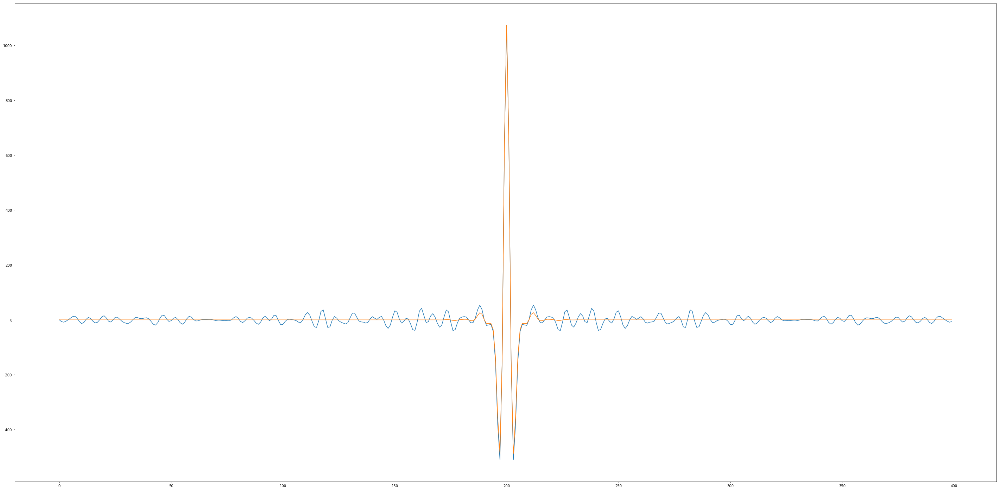

In [250]:
from scipy.stats import norm
mol = norm(200, 10).pdf(range(len(wav)))
fig = plt.figure(figsize=(50,25))
plt.plot(wav)
wav *= mol/np.max(np.abs(mol))
plt.plot(wav)
plt.show()

In [251]:
from sklearn.linear_model import Lasso
from scipy.linalg import circulant 
import tqdm

W = circulant(wav)

clf = Lasso()
spikes = []
for i in tqdm.tqdm(range(small_iline.shape[0])):
    clf.fit(W,small_iline[i,:])
    spikes.append(clf.coef_)


  1%|          | 61/5053 [00:04<05:38, 14.76it/s]/Users/blasscock/.edm/envs/hackathon2018/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)

100%|██████████| 5053/5053 [02:31<00:00, 33.42it/s]

Remove the low frequency drift.

In [254]:
from scipy.signal import butter, lfilter, firwin, filtfilt
from scipy.signal import fir_filter_design as ffd
from scipy.signal import filter_design as ifd

def lowpass_filter(y, lowcut, fs, window='hanning', numtaps=10):
    h = firwin(numtaps=numtaps, cutoff=lowcut, nyq=fs/2, window=window)
    return filtfilt(h, 1.0, y)

def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a

def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = filtfilt(b, a, data)
    return y

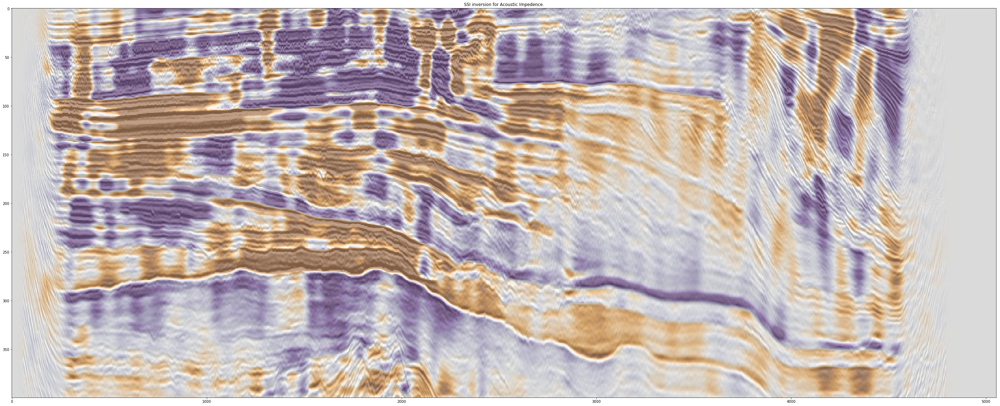

In [262]:
from scipy.ndimage import gaussian_filter

ssi = np.roll(np.array(spikes), -200, axis=1)
# seismic is only sensitive to  impedance constrast
ai = butter_bandpass_filter(np.cumsum(ssi,axis=1), 1, 160.0, 1/0.002, order=5)
sai = gaussian_filter(ai.T, (1,20), 0)
rng = np.max(np.abs(sai))
fig = plt.figure(figsize=(50,25))
plt.imshow(small_iline[:,:].T, figure=fig, cmap='gray', vmin=-2, vmax=2, aspect=5, alpha=0.5)
plt.imshow(sai, figure=fig, cmap='PuOr', aspect=5, alpha=0.5, vmin=-0.25*rng, vmax=0.25*rng)
plt.title('SSI inversion for Acoustic Impedence.')
#plt.colorbar()
plt.show()

*CGG's processing report contains the angles used:

Final Angle Stacks
a. Full Stack = 6 - 42 ̊
b. Near Stack = 6 - 18 ̊ 
c. Mid Stack = 18 - 30 ̊ 
d. Far Stack = 30 - 42 ̊

In [256]:
print (path.join(DATAPATH, "psdn11_TbsdmF_Near_Nov_11_32bit.segy"))

with segyio.open(path.join(DATAPATH, "psdn11_TbsdmF_Near_Nov_11_32bit.segy")) as fp:
    near = fp.iline[3788]
with segyio.open(path.join(DATAPATH, "psdn11_TbsdmF_Mid_Nov_11_32bit.segy")) as fp:
    mid = fp.iline[3788]
with segyio.open(path.join(DATAPATH, "psdn11_TbsdmF_Far_Nov_11_32bit.segy")) as fp:
    far = fp.iline[3788]

/Volumes/Backup/Poseidon/psdn11_TbsdmF_Near_Nov_11_32bit.segy


In [211]:
from sklearn.linear_model import LinearRegression

# Shuey
X = np.array([np.sin(np.deg2rad(12.0))**2, np.sin(np.deg2rad(24.0))**2, np.sin(np.deg2rad(36.0))**2])

clf = LinearRegression(fit_intercept=True)

AI = np.zeros(iline.shape)
SI = np.zeros(iline.shape)

for itr in range(0, iline.shape[1]):
    clf.fit(np.atleast_2d(X).T, np.array([near[:,itr], mid[:,itr], far[:,itr]]))
    AI[:,itr] = clf.coef_[:,0]
    SI[:,itr] = clf.intercept_



In [224]:
# seismic is only sensitive to  impedance constrast
_ai = butter_bandpass_filter(np.cumsum(AI,axis=1), 1, 160.0, 1/0.002, order=5)
sai = gaussian_filter(_ai.T, (10,50), 0)

_si = butter_bandpass_filter(np.cumsum(SI,axis=1), 1, 160.0, 1/0.002, order=5)
ssi = gaussian_filter(_si.T, (10,50), 0)

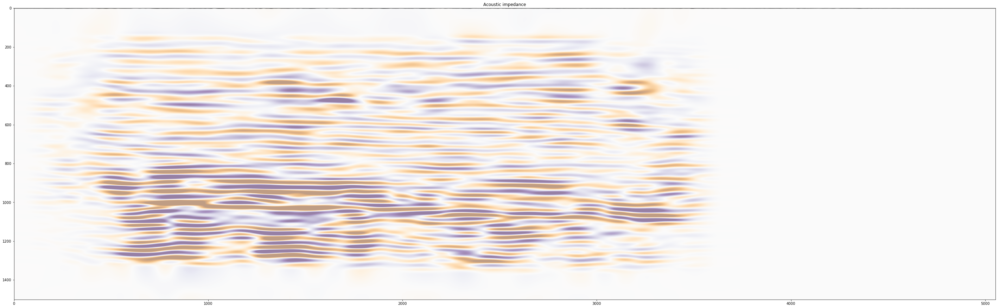

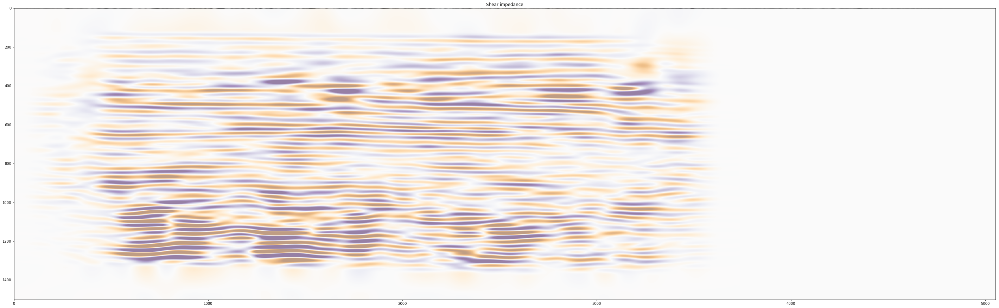

In [227]:
sai /= np.std(sai)
ssi /= np.std(ssi)

plt.figure(figsize=(50,25))
plt.imshow(iline.T, cmap='gray', vmin=-2, vmax=2, extent=[0,iline.shape[0],1501*0.002,0], aspect='auto')
plt.imshow(sai, vmin=-3, vmax=3, alpha=0.5, cmap='PuOr')
plt.title("Acoustic impedance")
plt.show()

plt.figure(figsize=(50,25))
plt.imshow(iline.T, cmap='gray', vmin=-2, vmax=2, extent=[0,iline.shape[0],1501*0.002,0], aspect='auto')
plt.imshow(ssi, vmin=-3, vmax=3, alpha=0.5, cmap='PuOr')
plt.title("Shear impedance")
plt.show()


In [199]:
print (X.shape)

(3,)


In [196]:
from sklearn.linear_model import LinearRegression
# too tired for this right now:
clf = LinearRegression()

In [188]:
np.save(path.expanduser('~/Desktop/AnInline2.npy'), iline)

### Next Steps

Derive features for unsupervised learning, or if you know something, make some training data.

In [178]:
# from the Deep learning node
from PIL import Image
im1 = Image.open("../../Images/Feature100.png")
im2 = Image.open("../../Images/Feature77.png")

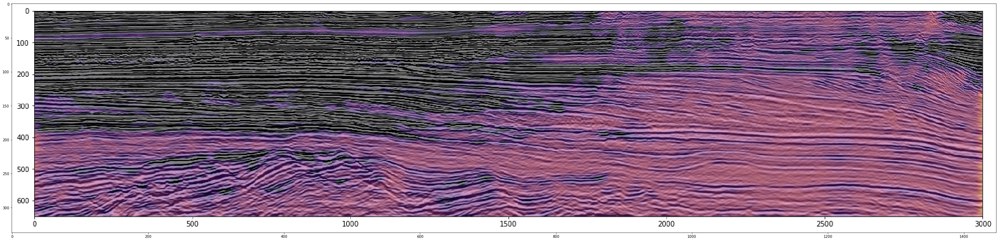

In [189]:
plt.figure(figsize=(50,25))
plt.imshow(im1)
plt.title("Feature 100")
plt.show()

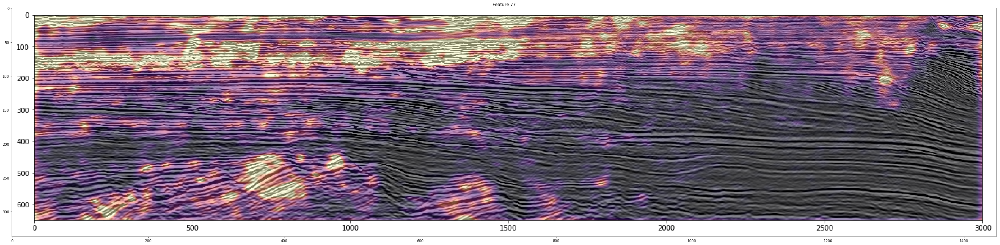

In [191]:
plt.figure(figsize=(50,25))
plt.imshow(im2)
plt.title("Feature 77")
plt.show()